In [1]:
import mldatasets
import pandas as pd
import numpy as np
import math
import re
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.probability import FreqDist
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

In [2]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /Users/serg/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/serg/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [4]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings")

datasets%2F610579%2F1093011%2Fchocolate.csv: Skipping, found more recently modified local copy (use --force to force download)
1 dataset files found in /Users/serg/EXTEND/PROJECTS/InterpretableMLBook/programming/Chapter6/data folder
parsing /Users/serg/EXTEND/PROJECTS/InterpretableMLBook/programming/Chapter6/data/datasets%2F610579%2F1093011%2Fchocolate.csv


In [5]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,blackberry,full body,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,rich cocoa,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_salt,have_not_sugar,have_sweetener_without_sugar,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fatty,mild nuts,mild fruit,NaN


In [6]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.\
                    drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,high roast,high astringnet,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich cocoa,long,NaN
89,creamy,fruit,cocoa,NaN


In [7]:
def make_dummies_with_limits(df, colname, min_recs=0.005,\
                             max_dummies=20, defcatname='Other',\
                             nospacechr='_'):
    if min_recs < 1:
        min_recs = df.shape[0]*min_recs
    topvals_df = df.groupby(colname).size().reset_index(name="counts").\
                    sort_values(by="counts", ascending=False).reset_index()
    other_l = topvals_df[(topvals_df.index > max_dummies) |\
                         (topvals_df.counts < min_recs)][colname].to_list()
    if len(other_l):
        df.loc[df[colname].isin(other_l), colname] = defcatname
    if len(nospacechr):
        df[colname] = df[colname].str.replace(' ',\
                                                  nospacechr, regex=False)
    return pd.get_dummies(df, prefix=[colname], columns=[colname])

In [8]:
def make_dummies_from_dict(df, colname, match_dict, 
                           drop_orig=True, nospacechr='_'):
    if type(match_dict) is list:
        if len(nospacechr):
            match_dict = {match_key:match_key.\
                              replace(' ', nospacechr)\
                              for match_key in match_dict }
        else:
            match_dict = {match_key:match_key\
                              for match_key in match_dict}
    for match_key in match_dict.keys():
        df[colname+'_'+match_dict[match_key]] =\
                    np.where(df[colname].str.contains(match_key), 1, 0)
    if drop_orig:
        return df.drop([colname], axis=1)
    else:
        return df

In [9]:
chocolateratings_df = make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

In [10]:
chocolateratings_df = chocolateratings_df.\
                                drop(['beans'], axis=1)
chocolateratings_df.cocoa_butter.\
        replace('have_cocoa_butter', 1, inplace=True)
chocolateratings_df.cocoa_butter.\
        replace('have_not_cocoa_butter', 0, inplace=True)
chocolateratings_df.vanilla.\
        replace('have_vanila', 1, inplace=True)
chocolateratings_df.vanilla.\
        replace('have_not_vanila', 0, inplace=True)
chocolateratings_df.lecithin.\
        replace('have_lecithin', 1, inplace=True)
chocolateratings_df.lecithin.\
        replace('have_not_lecithin', 0, inplace=True)
chocolateratings_df.salt.\
        replace('have_salt', 1, inplace=True)
chocolateratings_df.salt.\
        replace('have_not_salt', 0, inplace=True)
chocolateratings_df.sugar.\
        replace('have_sugar', 1, inplace=True)
chocolateratings_df.sugar.\
        replace('have_not_sugar', 0, inplace=True)
chocolateratings_df.sweetener_without_sugar.\
        replace('have_sweetener_without_sugar', 1, inplace=True)
chocolateratings_df.sweetener_without_sugar.\
        replace('have_not_sweetener_without_sugar', 0, inplace=True)

In [11]:
stop = stopwords.words('english')

In [12]:
trans_dict = {'?':'', '&':'', 'overly intense':'intensest',\
              'overly sweet':'sweetest', 'overly tart':'tartest',\
              'sl. bitter':'bitterness', 'sl. burnt':'burntness',\
              'sl. sweet':'sweetness', 'sl. dry':'dryness',\
              'sl. chalky':'chalkiness', 'sl. Burnt':'burntness',\
              'hints fruit':'fruitiness', 'hint fruit':'fruitiness',\
              'high acid':'acidic', 'high acidity':'acidic',\
              'moderate acidity':'acid', 'high roast':'roast',\
              'astringcy':'astringent', 'astringnet':'astringent',\
              'full body':'robust', 'astringency':'astringent',\
              'high astringent':'acidic', 'rich cocoa':'rich',\
              'mild bitter':'bitterish', 'fruit long':'fruit',\
              'base cocoa':'basic', 'basic cocoa':'basic', '-like':'',\
              'smomkey':'smokey', 'true':'real', '(n)':'', '/':' ',\
              '-':' ', ' +':' ' }
trans_regex = re.compile("|".join(map(re.escape, trans_dict.keys(  ))))

In [13]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip().str.lower().\
            apply(lambda s: trans_regex.sub(lambda match:\
                                trans_dict[match.group(0)], s)).\
            apply(lambda s: ' '.join([word for word in s.split()\
                                      if word not in (stop)]))
tastes_s

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object

In [14]:
np.unique(tastes_s).shape

(2178,)

In [15]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
commontastes_l

['cocoa',
 'rich',
 'fatty',
 'roasty',
 'nutty',
 'sweet',
 'sandy',
 'sour',
 'intense',
 'mild',
 'fruit',
 'sticky',
 'earthy',
 'spice',
 'molasses',
 'floral',
 'spicy',
 'woody',
 'coffee',
 'berry',
 'vanilla',
 'creamy']

In [16]:
chocolateratings_df['tastes'] = tastes_s

In [17]:
chocolateratings_df = make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

In [18]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
company                                      2224 non-null object
review_date                                  2224 non-null int64
cocoa_percent                                2224 non-null float64
rating                                       2224 non-null float64
counts_of_ingredients                        2224 non-null int64
cocoa_butter                                 2224 non-null int64
vanilla                                      2224 non-null int64
lecithin                                     2224 non-null int64
salt                                         2224 non-null int64
sugar                                        2224 non-null int64
sweetener_without_sugar                      2224 non-null int64
company_location_Canada                      2224 non-null uint8
company_location_France                      2224 non-null uint8
company_location_Other                     

In [19]:
n = 5
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

In [20]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

In [21]:
chocolateratings_df[chocolateratings_df.rating >= 3.5].shape[0]/\
                    chocolateratings_df.shape[0]

0.38444244604316546

In [22]:
orig_plt_params = plt.rcParams
sns.set()
def evaluate_mdl(fitted_model, X_train, X_test, y_train, y_test):
    y_train_pred = fitted_model.predict(X_train)
    y_test_prob = fitted_model.predict_proba(X_test)[:,1]
    y_test_pred = np.where(y_test_prob > 0.5, 1, 0)
    roc_auc = metrics.roc_auc_score(y_test, y_test_prob)
    plt.figure(figsize = (12,12))
    plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
    fpr, tpr, _ = metrics.roc_curve(y_test, y_test_prob)
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
    plt.xlabel('False Positive Rate', fontsize = 14)
    plt.ylabel('True Positive Rate', fontsize = 14)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.legend(loc="lower right")
    plt.show()
    print('Accuracy_train:  %.4f\t\tAccuracy_test:   %.4f' %\
                        (metrics.accuracy_score(y_train, y_train_pred),\
                         metrics.accuracy_score(y_test, y_test_pred)))
    print('Precision_test:  %.4f\t\tRecall_test:     %.4f' %\
                        (metrics.precision_score(y_test, y_test_pred),\
                         metrics.recall_score(y_test, y_test_pred)))
    print('ROC-AUC_test:    %.4f\t\tF1_test:         %.4f\t\tMCC_test: %.4f' %\
                        (roc_auc,\
                         metrics.f1_score(y_test, y_test_pred),\
                         metrics.matthews_corrcoef(y_test, y_test_pred)))
    return y_train_pred, y_test_prob, y_test_pred

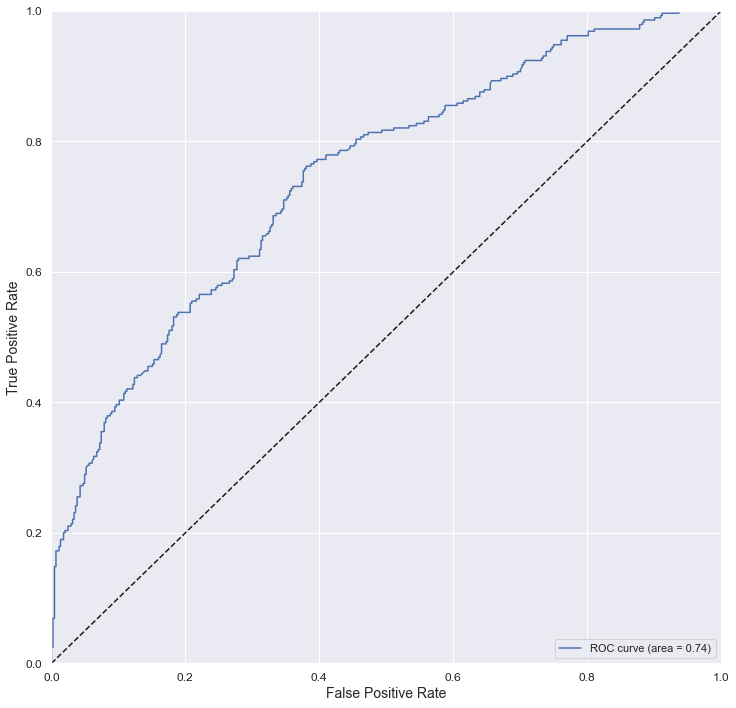

Accuracy_train:  0.7315		Accuracy_test:   0.6989
Precision_test:  0.6845		Recall_test:     0.4414
ROC-AUC_test:    0.7450		F1_test:         0.5367		MCC_test: 0.3461


In [23]:
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        evaluate_mdl(fitted_svm_mdl, X_train, X_test, y_train, y_test)

In [24]:
svm_mdl.classes_

array([0, 1])

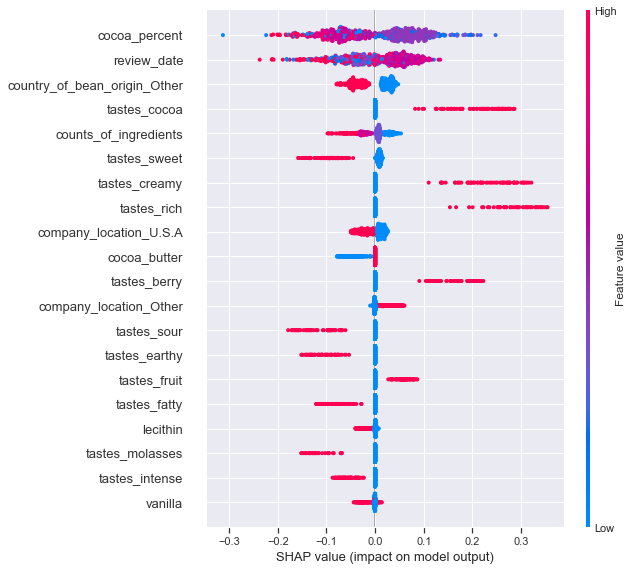

In [25]:
X_test_summary = shap.kmeans(X_test, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_test_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=214, l1_reg="num_features(20)")
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

In [26]:
np.random.seed(rand)
sample_test_size = 0.025
sample_test_idx = np.random.choice(X_test.shape[0],\
                                   math.ceil(X_test.shape[0]*sample_test_size),\
                                   replace=False)

In [27]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
FP = (y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 0).to_numpy() 
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

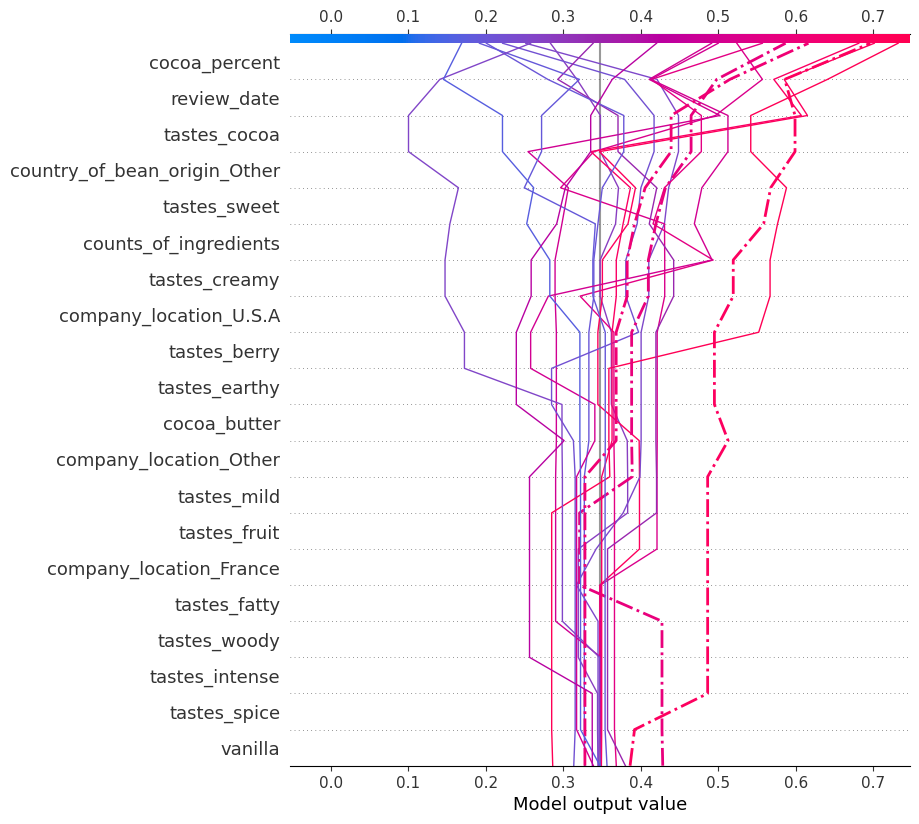

In [28]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.columns, highlight=FP)

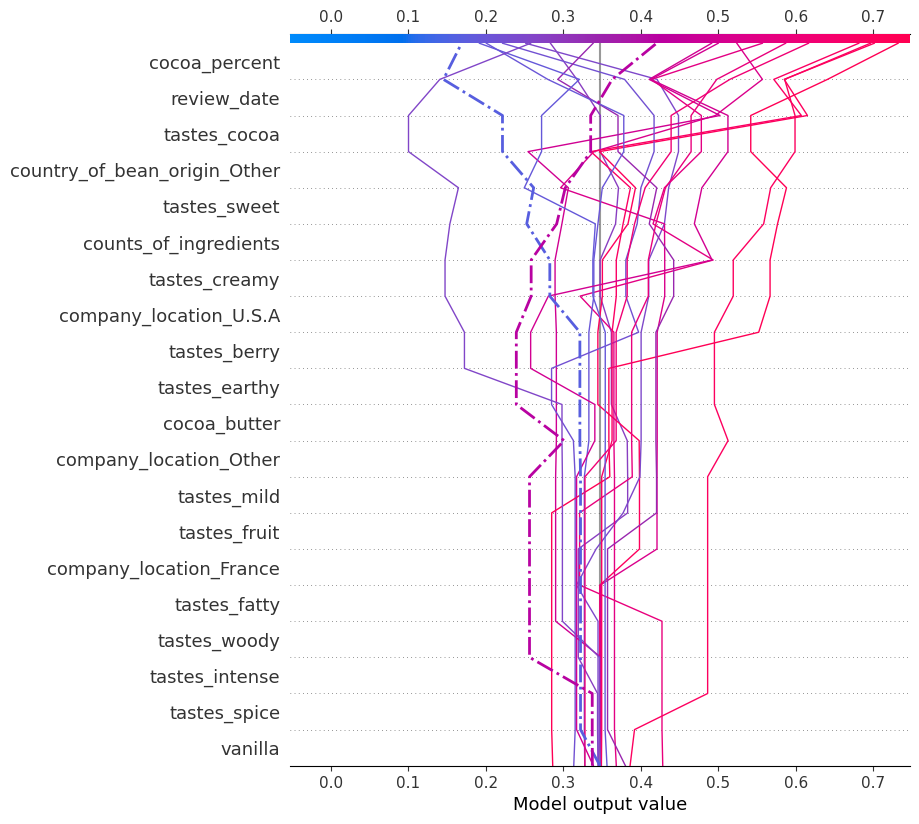

In [29]:
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.columns, highlight=FN)

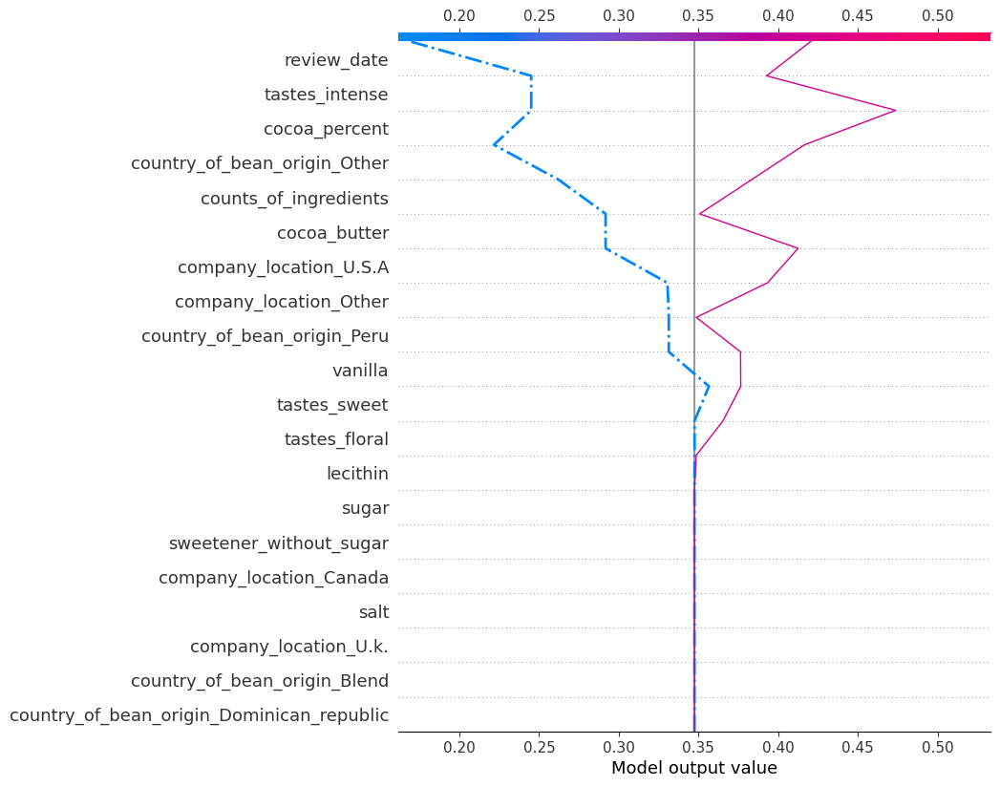

In [30]:
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx][FN],\
                   X_test.columns, highlight=0)

In [31]:
eval_idxs = (X_test.index==5) | (X_test.index==24)
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,5,24
rating,4.0,2.75
y,1.0,0.00
y_pred,1.0,0.00
review_date,2013.0,2015.00
cocoa_percent,70.0,70.00
counts_of_ingredients,4.0,4.00
cocoa_butter,1.0,1.00
vanilla,0.0,0.00
lecithin,1.0,1.00
salt,0.0,0.00


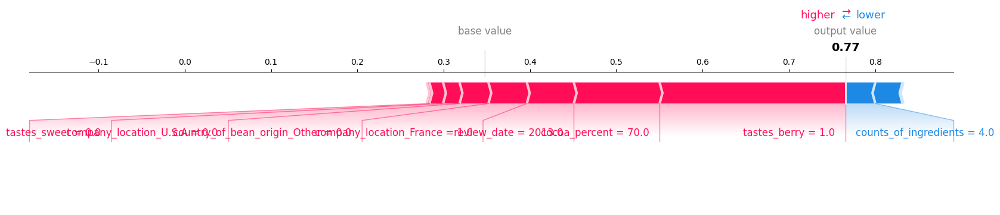

In [32]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5], X_test[X_test.index==5], 
                matplotlib=True)

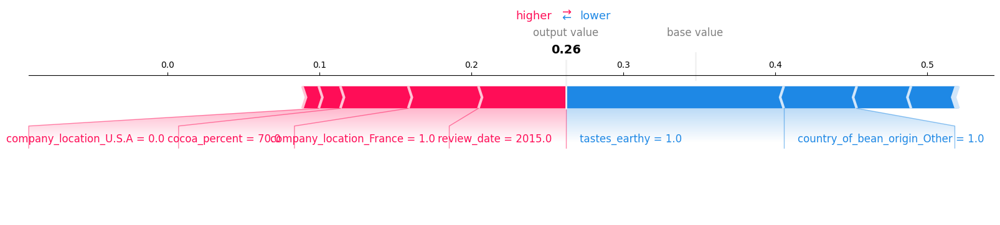

In [33]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24], X_test[X_test.index==24], 
                matplotlib=True)

In [34]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [35]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

In [36]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

In [37]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

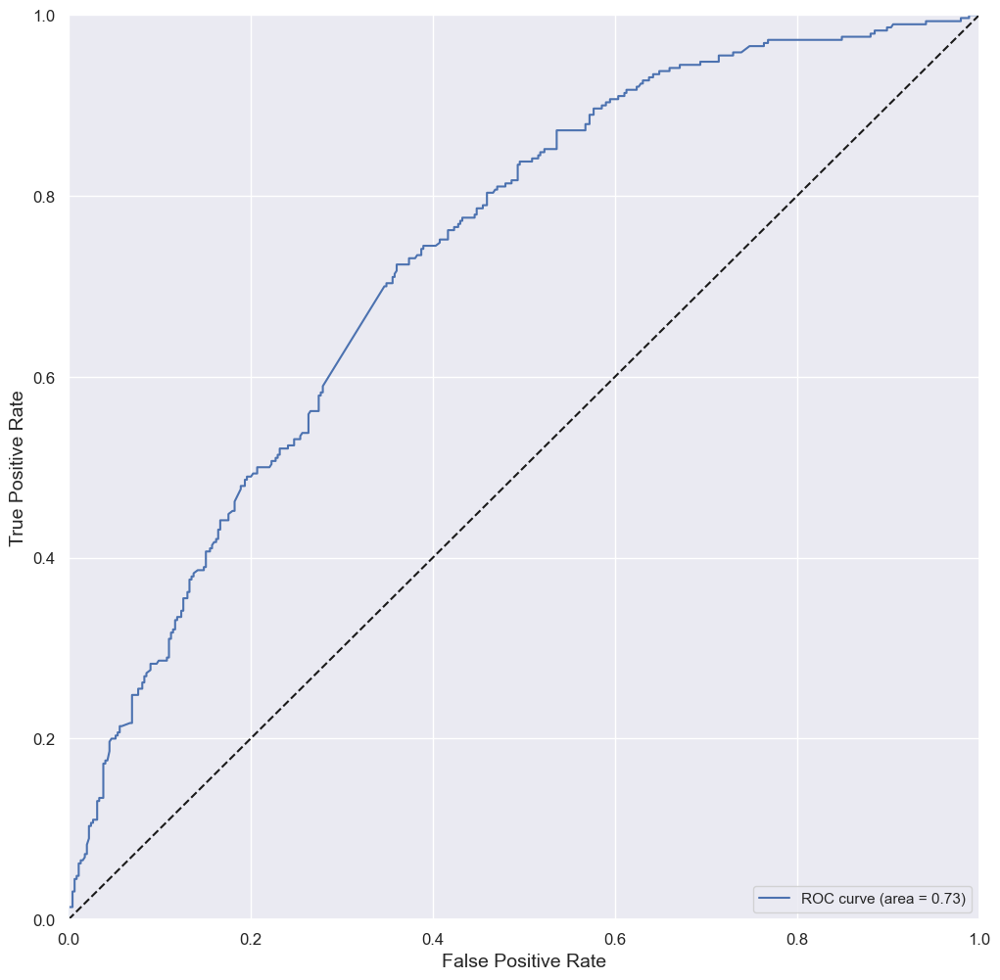

Accuracy_train:  0.7953		Accuracy_test:   0.6798
Precision_test:  0.6233		Recall_test:     0.4793
ROC-AUC_test:    0.7328		F1_test:         0.5419		MCC_test: 0.3084


In [38]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
                    n_estimators=100, objective='binary', random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    evaluate_mdl(fitted_lgb_mdl, X_train_nlp_fit, X_test_nlp_fit, y_train, y_test)

In [39]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

In [40]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

In [41]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [42]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [43]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

In [44]:
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)